In [1]:
# the cnn module provides classes for training/predicting with various types of CNNs
from opensoundscape.torch.models.cnn import CNN

#other utilities and packages
import torch
import pandas as pd
from pathlib import Path
import numpy as np
import pandas as pd
import random
import subprocess

#set up plotting
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for large visuals
%config InlineBackend.figure_format = 'retina'

In [2]:
torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

In [3]:
subprocess.run(['curl','https://pitt.box.com/shared/static/79fi7d715dulcldsy6uogz02rsn5uesd.gz','-L', '-o','woodcock_labeled_data.tar.gz']) # Download the data
subprocess.run(["tar","-xzf", "woodcock_labeled_data.tar.gz"]) # Unzip the downloaded tar.gz file
subprocess.run(["rm", "woodcock_labeled_data.tar.gz"]) # Remove the file after its contents are unzipped

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100     7    0     7    0     0      5      0 --:--:--  0:00:01 --:--:--    11
100 9499k  100 9499k    0     0  3602k      0  0:00:02  0:00:02 --:--:-- 11.2M


CompletedProcess(args=['rm', 'woodcock_labeled_data.tar.gz'], returncode=0)

In [4]:
#load Specky output: a table of labeled audio files
specky_table = pd.read_csv(Path("woodcock_labeled_data/woodcock_labels.csv"))
specky_table.head()

,filename,woodcock,sound_type
0,d4c40b6066b489518f8da83af1ee4984.wav,present,song
1,e84a4b60a4f2d049d73162ee99a7ead8.wav,absent,na
2,79678c979ebb880d5ed6d56f26ba69ff.wav,present,song
3,49890077267b569e142440fa39b3041c.wav,present,song
4,0c453a87185d8c7ce05c5c5ac5d525dc.wav,present,song


In [5]:
#update the paths to the audio files
specky_table.filename = ['./woodcock_labeled_data/'+f for f in specky_table.filename]
specky_table.head()

,filename,woodcock,sound_type
0,./woodcock_labeled_data/d4c40b6066b489518f8da8...,present,song
1,./woodcock_labeled_data/e84a4b60a4f2d049d73162...,absent,na
2,./woodcock_labeled_data/79678c979ebb880d5ed6d5...,present,song
3,./woodcock_labeled_data/49890077267b569e142440...,present,song
4,./woodcock_labeled_data/0c453a87185d8c7ce05c5c...,present,song


In [6]:
# create a new dataframe with the filenames from the previous table as the index
labels = pd.DataFrame(index=specky_table['filename'])

#convert 'present' to 1 and 'absent' to 0
labels['woodcock']=[1 if l=='present' else 0 for l in specky_table['woodcock']]



print(labels)


                                                    woodcock
filename                                                    
./woodcock_labeled_data/d4c40b6066b489518f8da83...         1
./woodcock_labeled_data/e84a4b60a4f2d049d73162e...         0
./woodcock_labeled_data/79678c979ebb880d5ed6d56...         1
./woodcock_labeled_data/49890077267b569e142440f...         1
./woodcock_labeled_data/0c453a87185d8c7ce05c5c5...         1
./woodcock_labeled_data/0fc107ec5e76bf7a98dd207...         0
./woodcock_labeled_data/50b6b7c7e843597e0dbc698...         1
./woodcock_labeled_data/35ca80c22127c3c0ae032a0...         0
./woodcock_labeled_data/f87d427bef752f5accbd899...         1
./woodcock_labeled_data/0ab7732b506105717708ea9...         1
./woodcock_labeled_data/ad90eefb6196ca83f9cf43b...         1
./woodcock_labeled_data/cd0b8d8a89321046e96abee...         0
./woodcock_labeled_data/24073ce519bf1d24107da8a...         1
./woodcock_labeled_data/863095c237c52ec51cff739...         1
./woodcock_labeled_data/

In [7]:
from sklearn.model_selection import train_test_split
train_df,validation_df = train_test_split(labels,test_size=0.2,random_state=1)

In [27]:
from opensoundscape.torch.models.cnn import load_model
import os

# Create model object
classes = train_df.columns #in this case, there's just one class: ["woodcock"]
# Specify path to model
model_path = './binary_train/best.model'
if os.path.exists(model_path):
    model = load_model(model_path)
else:
    # Raise an exception or print a message to indicate the path is invalid
    raise ValueError(f"Invalid path to model: {model_path}")
    model = CNN('resnet18',classes=classes,sample_duration=2.0)


In [9]:
#helper functions to visualize processed samples
from opensoundscape.preprocess.utils import show_tensor_grid, show_tensor
from opensoundscape.torch.datasets import AudioFileDataset

/root/bird/kitzes/lib/python3.8/site-packages/matplotlib_inline/config.py:68: DeprecationWarning: InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.
  def _figure_format_changed(self, name, old, new):
/root/bird/kitzes/lib/python3.8/site-packages/opensoundscape/preprocess/utils.py:93: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(len(tensors) // columns + 1, columns, i + 1)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255

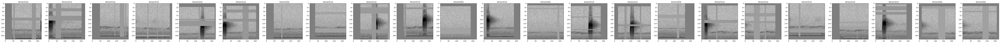

In [10]:


#generate a dataset with the samples we wish to generate and the model's preprocessor
inspection_dataset = AudioFileDataset(train_df, model.preprocessor)

#generate the samples using the dataset
samples = [sample['X'] for sample in inspection_dataset]
labels = [sample['y'] for sample in inspection_dataset]

#display the samples
_ = show_tensor_grid(samples, len(samples),labels=labels)



In [11]:
model.train(
    train_df= train_df,
    validation_df=validation_df,
    save_path='./binary_train/', #where to save the trained model
    epochs=15, #number of times it goes through every single training data once. so 15 dots in graph
    batch_size=10,
    save_interval=150, #save model every 5 epochs (the best model is always saved in addition)
    num_workers=0, #specify 4 if you have 4 CPU processes, eg; 0 means only the root process
)


model.save('./binary_train/best.model')


Training Epoch 94
Epoch: 94 [batch 0/3 (0.00%)] 
	DistLoss: 0.001
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 95
Epoch: 95 [batch 0/3 (0.00%)] 
	DistLoss: 0.004
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 96
Epoch: 96 [batch 0/3 (0.00%)] 
	DistLoss: 0.014
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 97
Epoch: 97 [batch 0/3 (0.00%)] 
	DistLoss: 0.039
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 98
Epoch: 98 [batch 0/3 (0.00%)] 
	DistLoss: 0.005
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 99
Epoch: 99 [batch 0/3 (0.00%)] 
	DistLoss: 0.003
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 100
Epoch: 100 [batch 0/3 (0.00%)] 
	DistLoss: 0.003
Metrics:
Metrics:
	MAP: 1.000

Validation.
[]
Metrics:
	MAP: 0.927

Training Epoch 101
Epoch: 101 [batch 0/3 (0.00%)] 
	DistLos

Text(0, 0.5, 'loss')

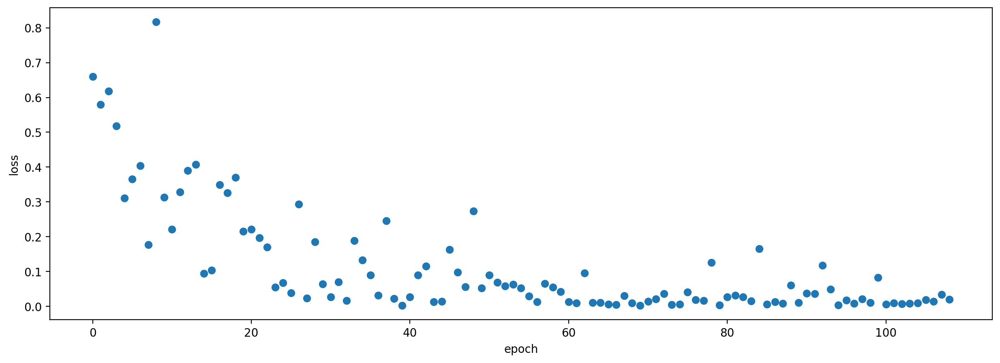

In [12]:
plt.scatter(model.loss_hist.keys(),model.loss_hist.values())
plt.xlabel('epoch')
plt.ylabel('loss')

In [13]:
from glob import glob
field_recordings = glob('./*.WAV')
field_recordings

['./20220601_053000.WAV',
 './20220601_063000.WAV',
 './20220601_083000.WAV',
 './20220601_073000.WAV']

In [14]:
prediction_scores_df = model.predict(field_recordings)

[]


In [15]:
print(prediction_scores_df)

(                                           woodcock
file                  start_time end_time          
./20220601_053000.WAV 0.0        2.0      -7.086870
                      2.0        4.0       3.802016
                      4.0        6.0      -1.353549
                      6.0        8.0       0.891236
                      8.0        10.0     -7.693542
...                                             ...
./20220601_073000.WAV 1790.0     1792.0   -4.602165
                      1792.0     1794.0   -7.612150
                      1794.0     1796.0   -1.387944
                      1796.0     1798.0   -6.168521
                      1798.0     1800.0   -3.622932

[3600 rows x 1 columns], None, [])


In [16]:
import os

#write to csv
# Predict on audio files
valid_scores = model.predict(
    field_recordings,
    activation_layer='sigmoid',
    split_files_into_clips=False
)

# Extract the DataFrame from the tuple and remove unnecessary elements
scores_df = valid_scores[0]
scores_df.index = [os.path.basename(f) for f in field_recordings]

# Add a new column 'Presence' based on the value of 'woodcock' column
scores_df['Presence'] = ['Present' if score > 0.9 else 'Absent' for score in scores_df['woodcock']]

# Save the DataFrame to a CSV file
scores_df.to_csv('outputWoodcock.csv')


[]


In [17]:
# import Audio and Spectrogram classes from OpenSoundscape
from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram

for i in field_recordings:
    audio = Audio.from_file(i)
    _, clip_df = audio.split(clip_duration=60,clip_overlap=10,final_clip=None)
    print(f"Number of clips for {i}: {len(clip_df)}")

Number of clips for ./20220601_053000.WAV: 35
Number of clips for ./20220601_063000.WAV: 35
Number of clips for ./20220601_083000.WAV: 35
Number of clips for ./20220601_073000.WAV: 35


In [24]:
print(clip_df.columns)

Index(['start_time', 'end_time'], dtype='object')


In [39]:
# import Audio and Spectrogram classes from OpenSoundscape
from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram
import os

# Create an empty DataFrame to store the scores
all_scores_df = pd.DataFrame()

folder_path = pathlib.Path('/root/bird/kitzes/')
field_recordings = [folder_path / f for f in os.listdir(folder_path) if f.endswith('.WAV')]


for i in field_recordings:
    audio = Audio.from_file(i)
    _, clip_df = audio.split(clip_duration=60,clip_overlap=10,final_clip=None)
    valid_scores = model.predict(
        clip_df,
        activation_layer='sigmoid',
        split_files_into_clips=True
    )

    # Extract the DataFrame from the tuple and remove unnecessary elements
    scores_df = valid_scores[0]

    # Add a new column 'Presence' based on the value of 'woodcock' column
    scores_df['Presence'] = ['Present' if score > 0.9 else 'Absent' for score in scores_df['woodcock']]

    # Add the scores to the all_scores_df DataFrame
    scores_df.index = [os.path.basename(i)] * len(scores_df)
    all_scores_df = pd.concat([all_scores_df, scores_df])

# Save the DataFrame to a CSV file
all_scores_df.to_csv('outputWoodcock.csv')



TypeError: expected str, bytes or os.PathLike object, not numpy.int64

In [31]:
import os

current_path = os.getcwd()
print(current_path)


/root/bird/kitzes
